# Dividing data to blocks

In [1]:
import sys
import json
import pandas as pd
import csv

In [6]:
pairs = pd.read_csv("/home/jovyan/work/data/nfs_shared_data/Raute/JsonForSchoolProjectTest/VerifiedPairs.csv")

pairs.drop(columns=["Unnamed: 0"],inplace=True)

pairs['pFile']=pairs.pFile.str.replace('bmp','json')
pairs['dFile']=pairs.dFile.str.replace('bmp','json')

jsonit = []
path = '/home/jovyan/work/data/nfs_shared_data/Raute/JsonForSchoolProjectTest/Dry/'
#for file in pairs['pFile']:
#    with open(path+file,'r') as f:
#        jsonit.append(json.load(f))
        
for file in pairs['dFile']:
    with open(path+file,'r') as f:
        jsonit.append(json.load(f))

viat = []
arkit = []
for j in range(len(jsonit)):
    for i in range(len(jsonit[j]['Defects'])):
        viat.append(jsonit[j]['Defects'][i]['m_ObjDefectName'])

pd.DataFrame(viat).value_counts()

DEFECT_DARK_KNOT         4066
DEFECT_HOLE              2247
DEFECT_INNER_SPLIT       1427
DEFECT_SOUND_KNOT        1259
DEFECT_LOOSE_KNOT         860
DEFECT_OPEN_SPLIT         707
DEFECT_DECAY              644
DEFECT_STRIPE             524
DEFECT_OVERLAP            147
DEFECT_FISHTAIL_END       117
DEFECT_CROSS_GRAIN         72
DEFECT_HEART               44
DEFECT_MISSING_CORNER      19
DEFECT_FISHTAIL_EDGE       15
DEFECT_WANE                 1
dtype: int64

In [7]:
jsonit[0]['FileName']

'20210505172657_52.datx'

# Object data

In [11]:
FIELDS = ["m_uWidth", "m_uLength","m_dThickness","ObjectResX", "ObjectResY"]

df_ObjectData = pd.json_normalize(jsonit[0]["ObjectData"][0])
#df_ObjectData[FIELDS]
df_ObjectData.drop(columns=df_ObjectData.columns.difference(FIELDS),inplace=True)
df_ObjectData

,m_uWidth,m_uLength,m_dThickness,ObjectResX,ObjectResY
0,1750.23265,1599.76152,1.56,0.58152,0.58595


# Moisture blocks

## Defining coordinates

In [12]:
df_MoistureBlocks = pd.json_normalize(jsonit[0]["MoistureBlocks"])
df_coordinates = df_MoistureBlocks.drop(columns=["m_dCalculatedFeatures","FeaturesExplained"])
df_coordinates

,m_pntTL.x,m_pntTL.y,m_pntTR.x,m_pntTR.y,m_pntBL.x,m_pntBL.y,m_pntBR.x,m_pntBR.y
0,1134,34,1272,34,1134,98,1272,98
1,1306,34,1444,34,1306,98,1444,98
2,1822,34,1960,34,1822,98,1960,98
3,1994,34,2132,34,1994,98,2132,98
4,2510,34,2648,34,2510,98,2648,98
...,...,...,...,...,...,...,...,...
271,1306,2914,1444,2914,1306,2978,1444,2978
272,1822,2914,1960,2914,1822,2978,1960,2978
273,1994,2914,2132,2914,1994,2978,2132,2978
274,2510,2914,2648,2914,2510,2978,2648,2978


## Defining calculated features

In [13]:
df_calculatedFeatures = pd.DataFrame(df_MoistureBlocks["m_dCalculatedFeatures"].to_list(), columns=['Moisture', 'Temperature'])
df_calculatedFeatures

,Moisture,Temperature
0,120.079415,32.715626
1,111.417279,32.715626
2,126.424345,34.779999
3,125.890390,34.779999
4,123.073276,33.336249
...,...,...
271,116.982223,34.230936
272,116.430233,36.615781
273,125.136675,36.615781
274,119.140910,34.099375


## Merging calculated features and coordinates

In [14]:
df_MoistureBlocks = df_calculatedFeatures.join(df_coordinates)
df_MoistureBlocks

,Moisture,Temperature,m_pntTL.x,m_pntTL.y,m_pntTR.x,m_pntTR.y,m_pntBL.x,m_pntBL.y,m_pntBR.x,m_pntBR.y
0,120.079415,32.715626,1134,34,1272,34,1134,98,1272,98
1,111.417279,32.715626,1306,34,1444,34,1306,98,1444,98
2,126.424345,34.779999,1822,34,1960,34,1822,98,1960,98
3,125.890390,34.779999,1994,34,2132,34,1994,98,2132,98
4,123.073276,33.336249,2510,34,2648,34,2510,98,2648,98
...,...,...,...,...,...,...,...,...,...,...
271,116.982223,34.230936,1306,2914,1444,2914,1306,2978,1444,2978
272,116.430233,36.615781,1822,2914,1960,2914,1822,2978,1960,2978
273,125.136675,36.615781,1994,2914,2132,2914,1994,2978,2132,2978
274,119.140910,34.099375,2510,2914,2648,2914,2510,2978,2648,2978


# Density

In [15]:
df_DensityBlocks = pd.json_normalize(jsonit[0]["DensityBlocks"])
df_DensityBlocks

,Density,m_pntTL.x,m_pntTL.y,m_pntTR.x,m_pntTR.y,m_pntBL.x,m_pntBL.y,m_pntBR.x,m_pntBR.y
0,967.513015,765,34,1039,34,765,98,1039,98
1,1011.198652,765,98,1039,98,765,162,1039,162
2,976.182619,2966,34,3240,34,2966,98,3240,98
3,1035.248569,2966,98,3240,98,2966,162,3240,162
4,1016.816563,765,162,1039,162,765,226,1039,226
...,...,...,...,...,...,...,...,...,...
87,1039.556130,765,2914,1039,2914,765,2978,1039,2978
88,1028.912957,2966,2722,3240,2722,2966,2786,3240,2786
89,1054.534560,2966,2786,3240,2786,2966,2850,3240,2850
90,1045.062843,2966,2850,3240,2850,2966,2914,3240,2914


# Defects

In [16]:
df_Defects = pd.json_normalize(jsonit[0]["Defects"])
df_Defects = df_Defects.drop(columns=["m_dFeatures","m_pPresentation.m_ePresentation","m_pPresentation.m_iReportingFrontEdge",
                                     "m_pPresentation.m_iPoints", "m_pPresentation.m_pntPoint", "m_mmpntRectangle.x", "m_mmpntRectangle.y"])
df_Defects

,name,m_iDefectType,m_dOriginalFeatures,m_ObjDefectName,m_mmpntGravity.x,m_mmpntGravity.y
0,MObjDefect,1,"[10.467360000000001, 8.78925, 10.7628831863403...",DEFECT_HOLE,1497,37
1,MObjDefect,7,"[34.891200000000005, 9.96115, 33.0971260070800...",DEFECT_SOUND_KNOT,343,15
2,MObjDefect,12,"[25.005360000000003, 13.476849999999999, 23.49...",DEFECT_DARK_KNOT,1497,37
3,MObjDefect,12,"[5.815200000000001, 5.27355, 6.84009313583374,...",DEFECT_DARK_KNOT,704,52
4,MObjDefect,12,"[21.51624, 12.890899999999998, 21.049861907958...",DEFECT_DARK_KNOT,719,51
...,...,...,...,...,...,...
116,MObjDefect,12,"[26.749920000000003, 12.30495, 24.319965362548...",DEFECT_DARK_KNOT,408,1637
117,MObjDefect,12,"[16.28256, 9.96115, 16.153966903686523, 10.458...",DEFECT_DARK_KNOT,1793,1617
118,MObjDefect,12,"[13.374960000000002, 7.61735, 13.9196786880493...",DEFECT_DARK_KNOT,1545,1656
119,MObjDefect,12,"[3.48912, 2.92975, 4.191540718078613, 3.310214...",DEFECT_DARK_KNOT,1690,1623


In [17]:
df_OriginalFeatures = pd.DataFrame(df_Defects["m_dOriginalFeatures"].to_list())
df_OriginalFeatures.drop(columns=df_OriginalFeatures.columns.difference([0,1]),inplace=True)
df_OriginalFeatures.rename(columns={0: "DEFECT_FEATURE_BOX_LENGTH",
                                    1: "DEFECT_FEATURE_BOX_WIDTH"}, inplace=True, errors='raise')
df_OriginalFeatures

,DEFECT_FEATURE_BOX_LENGTH,DEFECT_FEATURE_BOX_WIDTH
0,10.46736,8.78925
1,34.89120,9.96115
2,25.00536,13.47685
3,5.81520,5.27355
4,21.51624,12.89090
...,...,...
116,26.74992,12.30495
117,16.28256,9.96115
118,13.37496,7.61735
119,3.48912,2.92975


In [18]:
df_Defects = df_Defects.drop(columns=["m_dOriginalFeatures","name","m_iDefectType"])
df_Defects                         

,m_ObjDefectName,m_mmpntGravity.x,m_mmpntGravity.y
0,DEFECT_HOLE,1497,37
1,DEFECT_SOUND_KNOT,343,15
2,DEFECT_DARK_KNOT,1497,37
3,DEFECT_DARK_KNOT,704,52
4,DEFECT_DARK_KNOT,719,51
...,...,...,...
116,DEFECT_DARK_KNOT,408,1637
117,DEFECT_DARK_KNOT,1793,1617
118,DEFECT_DARK_KNOT,1545,1656
119,DEFECT_DARK_KNOT,1690,1623


## Merging defect features

In [19]:
df_Defects = df_OriginalFeatures.join(df_Defects)
df_Defects

,DEFECT_FEATURE_BOX_LENGTH,DEFECT_FEATURE_BOX_WIDTH,m_ObjDefectName,m_mmpntGravity.x,m_mmpntGravity.y
0,10.46736,8.78925,DEFECT_HOLE,1497,37
1,34.89120,9.96115,DEFECT_SOUND_KNOT,343,15
2,25.00536,13.47685,DEFECT_DARK_KNOT,1497,37
3,5.81520,5.27355,DEFECT_DARK_KNOT,704,52
4,21.51624,12.89090,DEFECT_DARK_KNOT,719,51
...,...,...,...,...,...
116,26.74992,12.30495,DEFECT_DARK_KNOT,408,1637
117,16.28256,9.96115,DEFECT_DARK_KNOT,1793,1617
118,13.37496,7.61735,DEFECT_DARK_KNOT,1545,1656
119,3.48912,2.92975,DEFECT_DARK_KNOT,1690,1623


## Converting gravity coordinates to pixels

In [20]:
df_Defects['GravityX'] = df_Defects['m_mmpntGravity.x'] / df_ObjectData['ObjectResX'][0]
df_Defects['GravityY'] = df_Defects['m_mmpntGravity.y'] / df_ObjectData['ObjectResY'][0]
df_Defects = df_Defects.drop(columns=["m_mmpntGravity.x","m_mmpntGravity.y"]) # Drop gravity millimeter coordinates

In [21]:
df_Defects

,DEFECT_FEATURE_BOX_LENGTH,DEFECT_FEATURE_BOX_WIDTH,m_ObjDefectName,GravityX,GravityY
0,10.46736,8.78925,DEFECT_HOLE,2574.288073,63.145320
1,34.89120,9.96115,DEFECT_SOUND_KNOT,589.833540,25.599454
2,25.00536,13.47685,DEFECT_DARK_KNOT,2574.288073,63.145320
3,5.81520,5.27355,DEFECT_DARK_KNOT,1210.620443,88.744773
4,21.51624,12.89090,DEFECT_DARK_KNOT,1236.414913,87.038143
...,...,...,...,...,...
116,26.74992,12.30495,DEFECT_DARK_KNOT,701.609575,2793.753733
117,16.28256,9.96115,DEFECT_DARK_KNOT,3083.298941,2759.621128
118,13.37496,7.61735,DEFECT_DARK_KNOT,2656.830376,2826.179708
119,3.48912,2.92975,DEFECT_DARK_KNOT,2906.176916,2769.860910


# Determining max x- and y-coordinates of moisture blocks, density blocks and defects to get an approximate of sheet right edge

In [22]:
max_x = []
max_y = []

## Maximum coordinates of moisture blocks

### Max x-coordinate

In [23]:
for key in df_MoistureBlocks.keys():
    if '.x' in key:
        max_x.append(df_MoistureBlocks[key].max())

### Max y-coordinate

In [24]:
for key in df_MoistureBlocks.keys():
    if '.y' in key:
        max_y.append(df_MoistureBlocks[key].max())

## Maximum coordinates of density blocks

### Max x-coordinate

In [25]:
for key in df_DensityBlocks.keys():
    if '.x' in key:
        max_x.append(df_DensityBlocks[key].max())

### Max y-coordinate

In [26]:
for key in df_DensityBlocks.keys():
    if '.y' in key:
        max_y.append(df_DensityBlocks[key].max())

## Maximum coordinates of defects

### Max x-coordinate

In [27]:
max_x.append(df_Defects['GravityX'].max())

### Max y-coordinate

In [28]:
max_y.append(df_Defects['GravityY'].max())

## Max coordinates of all

In [29]:
max_x = max(max_x)

In [30]:
max_y = max(max_y)

## Plotting max point (should be bottom right corner of the sheet)

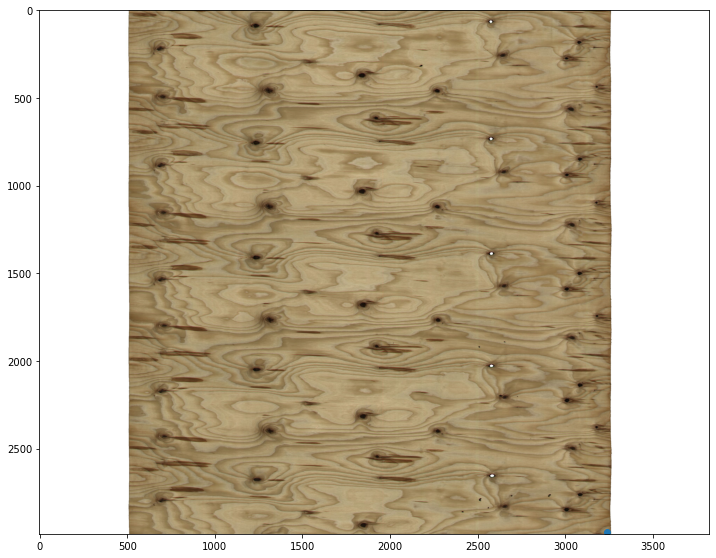

In [31]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,12))
plt.scatter(max_x,max_y)
#plt.scatter(x,y,c='red', label='density')
img = plt.imread("ColorImage.jpeg")
imgplot = plt.imshow(img)

# Determining approximate minimun coordinates of the sheet

In [32]:
width_in_pixels = df_ObjectData['m_uWidth'] / df_ObjectData['ObjectResY']
length_in_pixels = df_ObjectData['m_uLength'] / df_ObjectData['ObjectResX']
min_y = max_y - width_in_pixels
min_x = max_x - length_in_pixels
print(min_y) # Would it be good to round number to zero, if it is negative?
print(min_x)

0   -9.0
dtype: float64
0    489.0
dtype: float64


### Making sure that minimum coordinates are not below zero

In [33]:
min_x = 0 if float(min_x) < 0 else float(min_x)
min_y = 0 if float(min_y) < 0 else float(min_y)

## Plotting min point (top left)

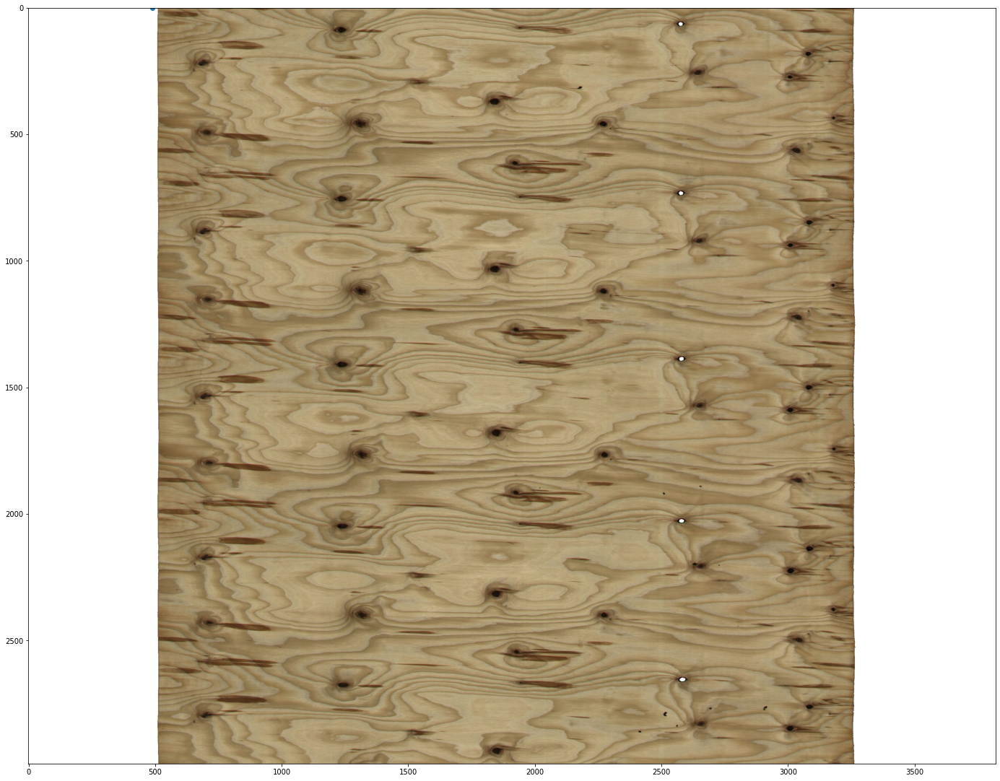

In [34]:
plt.figure(figsize=(24,24))
plt.scatter(min_x,min_y)
#plt.scatter(x,y,c='red', label='density')
img = plt.imread("ColorImage.jpeg")
imgplot = plt.imshow(img)

# Plotting all corners

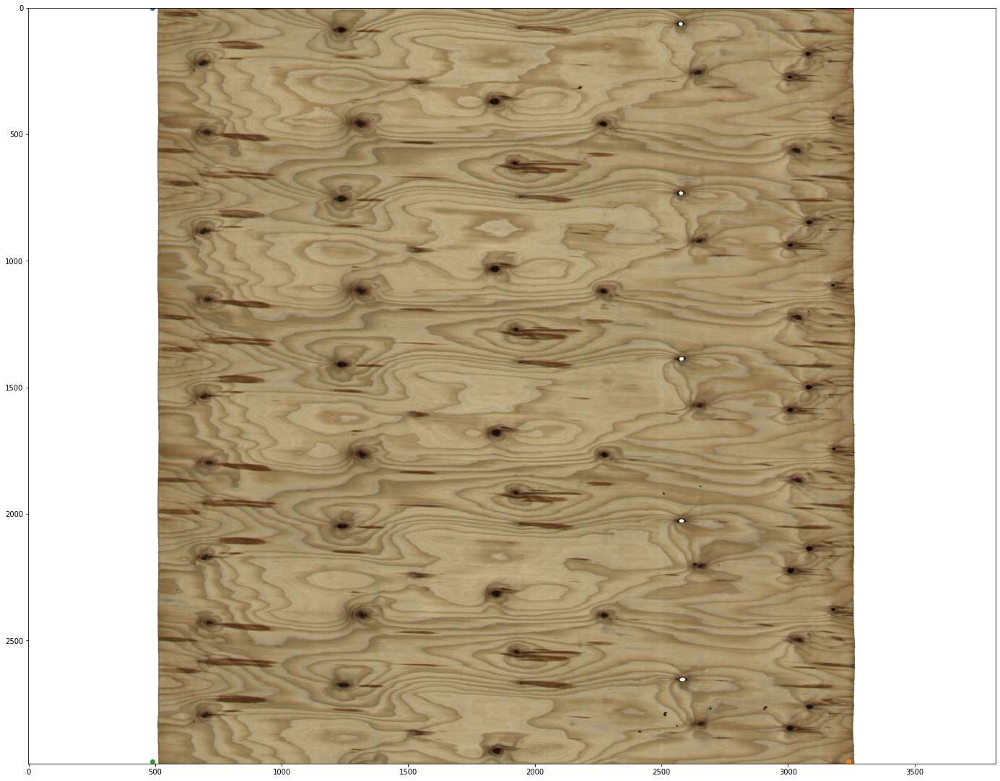

In [35]:
plt.figure(figsize=(24,24))
plt.scatter(min_x,min_y)
plt.scatter(max_x,max_y)
plt.scatter(min_x,max_y)
plt.scatter(max_x,min_y)
#plt.scatter(x,y,c='red', label='density')
img = plt.imread("ColorImage.jpeg")
imgplot = plt.imshow(img)

# Splitting sheet to nine grids

## Horizontal lines

In [36]:
firstH = max_y / 3
secondH = firstH * 2

## Vertical lines

In [37]:
firstV = (max_x-min_x) / 3
secondV = firstV * 2 + min_x
firstV = firstV + min_x

In [38]:
firstV - min_x

917.0

In [39]:
secondV - firstV

917.0

In [40]:
max_x - secondV

917.0

## Plotting grid

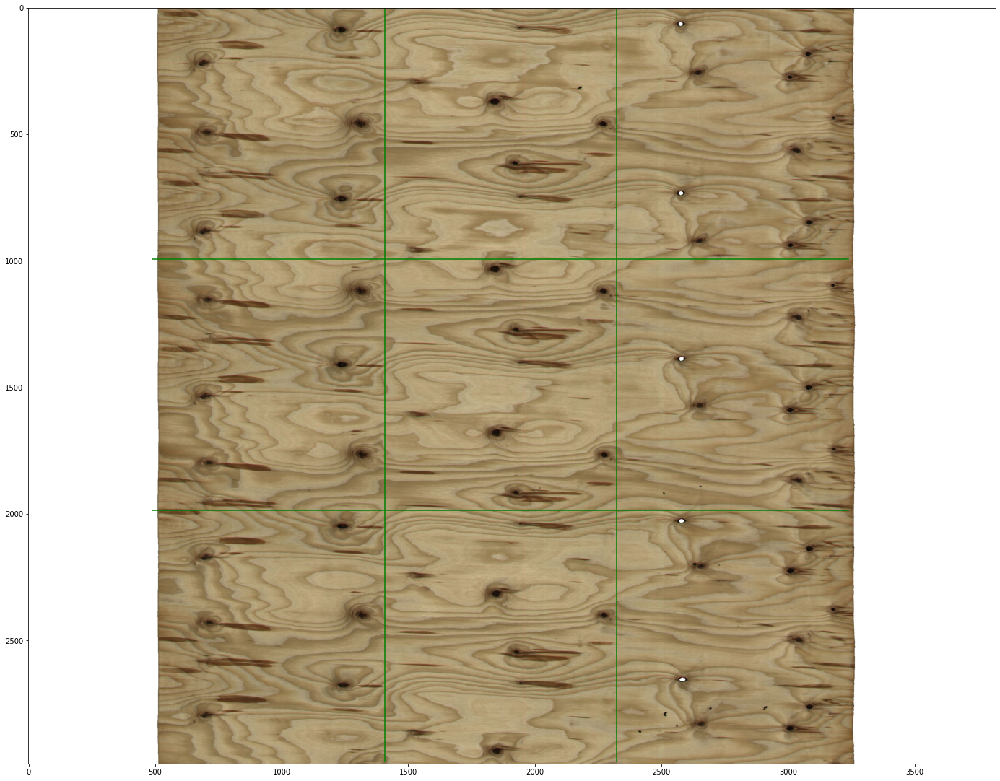

In [41]:
plt.figure(figsize=(24,24))
plt.plot([min_x,max_x],[firstH,firstH], color='green')
plt.plot([min_x,max_x],[secondH,secondH], color='green')
plt.plot([firstV,firstV],[min_y,max_y], color='green')
plt.plot([secondV,secondV],[min_y,max_y], color='green')
img = plt.imread("ColorImage.jpeg")
imgplot = plt.imshow(img)
#plt.plot(

# Plotting also sensors and defects to the same plot

## Adding moisture blocks

In [42]:
mX = []
for key in df_MoistureBlocks.keys():
    if '.x' in key:
        mX += df_MoistureBlocks[key].to_list()

mY = []
for key in df_MoistureBlocks.keys():
    if '.y' in key:
        mY += df_MoistureBlocks[key].to_list()

## Adding density blocks

In [43]:
dX = []
for key in df_DensityBlocks.keys():
    if '.x' in key:
        dX += df_DensityBlocks[key].to_list()

dY = []
for key in df_DensityBlocks.keys():
    if '.y' in key:
        dY += df_DensityBlocks[key].to_list()

## Adding defects

In [44]:
defectX = df_Defects['GravityX'].to_list()
defectY = df_Defects['GravityY'].to_list()

## Visualizing everything

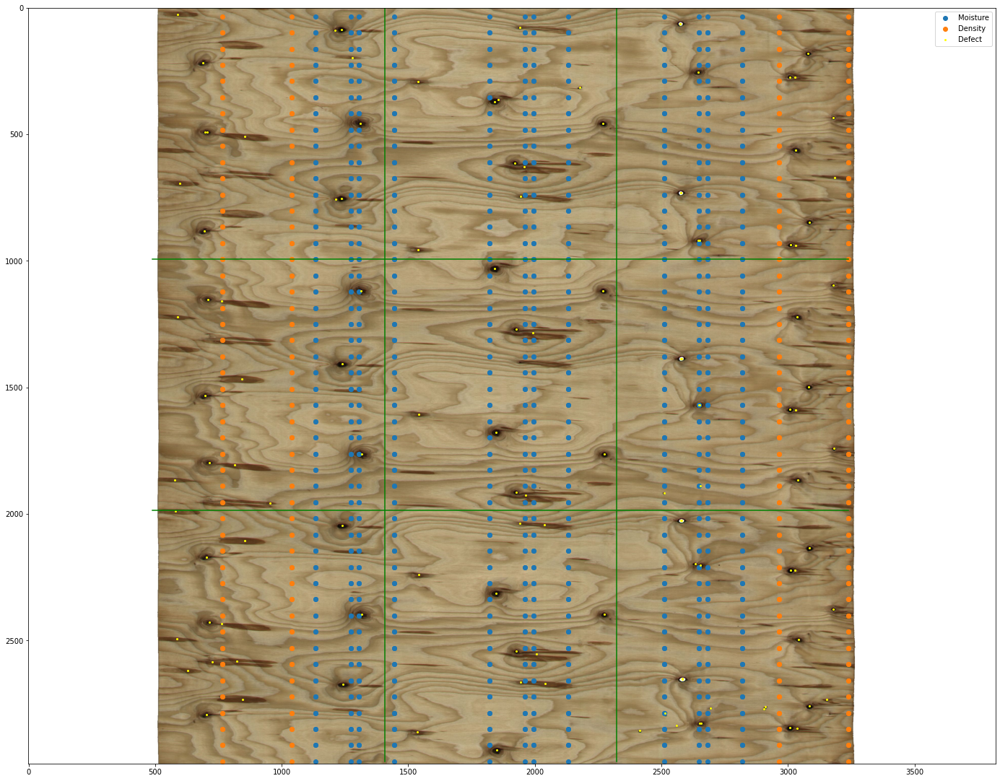

In [45]:
plt.figure(figsize=(24,24))
plt.plot([min_x,max_x],[firstH,firstH], color='green')
plt.plot([min_x,max_x],[secondH,secondH], color='green')
plt.plot([firstV,firstV],[min_y,max_y], color='green')
plt.plot([secondV,secondV],[min_y,max_y], color='green')
plt.scatter(mX,mY,label='Moisture')
plt.scatter(dX,dY,label='Density')
plt.scatter(defectX,defectY,s=4,label='Defect',color='yellow')
plt.legend()
img = plt.imread("ColorImage.jpeg")
imgplot = plt.imshow(img)

# Creating feature matrix using nine blocks 

## Basic features

In [46]:
basic_features = df_ObjectData.drop(columns=['ObjectResX','ObjectResY'])
basic_features

,m_uWidth,m_uLength,m_dThickness
0,1750.23265,1599.76152,1.56


## Block 1

### Moisture

In [47]:
B1_Mcondition = (df_MoistureBlocks['m_pntTL.x'] <= firstV) & (df_MoistureBlocks['m_pntTR.x'] <= firstV) & (df_MoistureBlocks['m_pntBL.x'] <= firstV) & (df_MoistureBlocks['m_pntBR.x'] <= firstV) & (df_MoistureBlocks['m_pntTL.y'] <= firstH) & (df_MoistureBlocks['m_pntTR.y'] <= firstH) & (df_MoistureBlocks['m_pntBL.y'] <= firstH) & (df_MoistureBlocks['m_pntBR.y'] <= firstH)

In [48]:
B1_moisture = df_MoistureBlocks.loc[B1_Mcondition]

In [49]:
m1X = []
for key in B1_moisture.keys():
    if '.x' in key:
        m1X += B1_moisture[key].to_list()

m1Y = []
for key in B1_moisture.keys():
    if '.y' in key:
        m1Y += B1_moisture[key].to_list()

## Density

In [50]:
B1_Dcondition = (df_DensityBlocks['m_pntTL.x'] <= firstV) & (df_DensityBlocks['m_pntTR.x'] <= firstV) & (df_DensityBlocks['m_pntBL.x'] <= firstV) & (df_DensityBlocks['m_pntBR.x'] <= firstV) & (df_DensityBlocks['m_pntTL.y'] <= firstH) & (df_DensityBlocks['m_pntTR.y'] <= firstH) & (df_DensityBlocks['m_pntBL.y'] <= firstH) & (df_DensityBlocks['m_pntBR.y'] <= firstH)

In [51]:
B1_density = df_DensityBlocks.loc[B1_Dcondition]

In [52]:
d1X = []
for key in B1_density.keys():
    if '.x' in key:
        d1X += B1_density[key].to_list()

d1Y = []
for key in B1_density.keys():
    if '.y' in key:
        d1Y += B1_density[key].to_list()

## Defects - knots

In [53]:
B1_DefectCondition = (df_Defects['GravityX'] <= firstV) & (df_Defects['GravityY'] <= firstH)
# B1_DefectOnlyKnots = (df_Defects['m_ObjDefectName'] == 'DEFECT_DARK_KNOT') | (df_Defects['m_ObjDefectName'] == 'DEFECT_SOUND_KNOT')
B1_DefectOnlyKnots = (df_Defects['m_ObjDefectName'].str.endswith('KNOT'))

In [54]:
B1_DefectKnots = df_Defects.loc[B1_DefectCondition & B1_DefectOnlyKnots]

In [55]:
B1_DefectKnots

,DEFECT_FEATURE_BOX_LENGTH,DEFECT_FEATURE_BOX_WIDTH,m_ObjDefectName,GravityX,GravityY
1,34.89120,9.96115,DEFECT_SOUND_KNOT,589.833540,25.599454
3,5.81520,5.27355,DEFECT_DARK_KNOT,1210.620443,88.744773
4,21.51624,12.89090,DEFECT_DARK_KNOT,1236.414913,87.038143
9,16.86408,4.68760,DEFECT_SOUND_KNOT,1277.686064,196.262480
13,22.67928,13.47685,DEFECT_DARK_KNOT,687.852524,216.742043
18,49.42920,21.09420,DEFECT_SOUND_KNOT,696.450681,489.802884
20,25.00536,19.33635,DEFECT_DARK_KNOT,1310.359059,455.670279
21,18.02712,9.37520,DEFECT_DARK_KNOT,705.048838,491.509514
30,5.23368,4.10165,DEFECT_DARK_KNOT,1212.340074,757.743835
31,23.26080,12.30495,DEFECT_DARK_KNOT,1236.414913,754.330574


## Defects - decay

In [56]:
B1_DefectDecay = (df_Defects['m_ObjDefectName'] == 'DEFECT_DECAY')
B1_DefectDecayBlock = df_Defects.loc[B1_DefectCondition & B1_DefectDecay]

In [57]:
B1_DefectDecayBlock

,DEFECT_FEATURE_BOX_LENGTH,DEFECT_FEATURE_BOX_WIDTH,m_ObjDefectName,GravityX,GravityY
17,104.6736,15.82065,DEFECT_DECAY,854.656762,508.575817
27,52.3368,11.13305,DEFECT_DECAY,598.431696,694.598515


## Defects - all other

In [ ]:
DEFECT_DARK_KNOT       6197
DEFECT_DECAY           1622
DEFECT_SOUND_KNOT       565
DEFECT_HEART            278
DEFECT_HOLE             266
DEFECT_OPEN_SPLIT        39
DEFECT_FISHTAIL_END      18
DEFECT_INNER_SPLIT       17
DEFECT_WANE 

In [58]:
B1_defectsRest = df_Defects['m_ObjDefectName']

In [59]:
B1_defectsRest = (df_Defects['m_ObjDefectName'].str.endswith('KNOT') == False) 

In [60]:
B1_defectsRestBlock = (df_Defects['m_ObjDefectName'].str.contains('KNOT') == False) & (df_Defects['m_ObjDefectName'] != 'DEFECT_DECAY')
B1_defectsRest = df_Defects.loc[B1_DefectCondition & B1_defectsRestBlock]

# B1_defectsRest = df_Defects[df_Defects['m_ObjDefectName'].str.contains('KNOT') == False]  != df_Defects[df_Defects['m_ObjDefectName'] == 'DEFECT_DECAY']

In [61]:
B1_defectsRest.shape

(0, 5)

## Visualizing Block 1

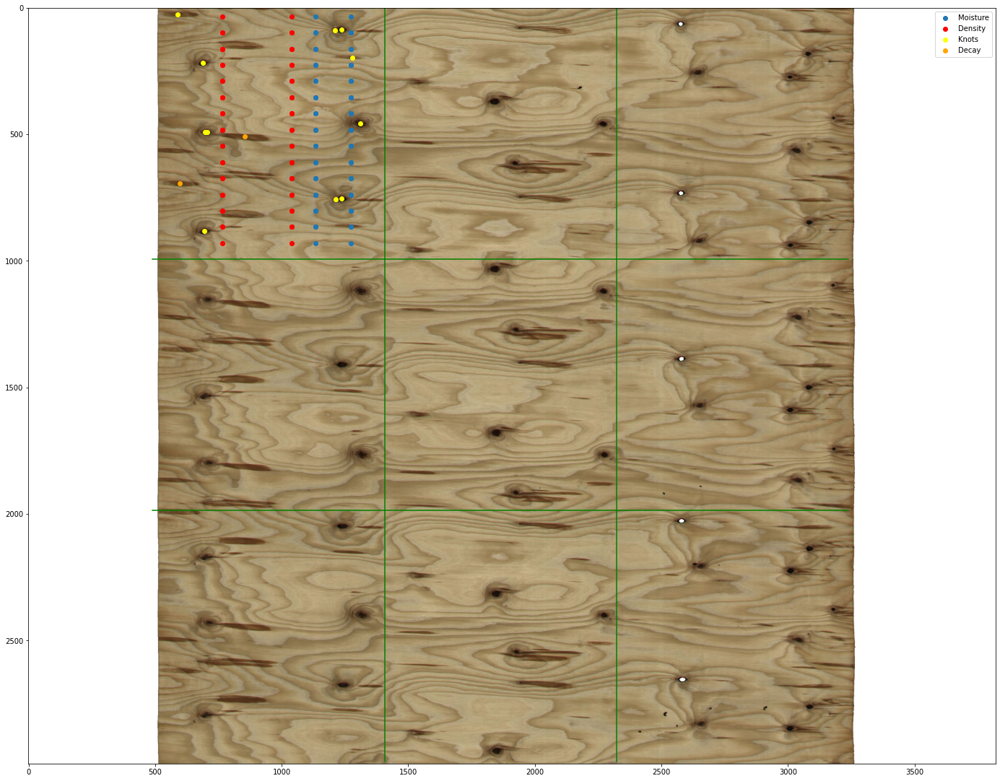

In [62]:
plt.figure(figsize=(24,24))
plt.plot([min_x,max_x],[firstH,firstH], color='green')
plt.plot([min_x,max_x],[secondH,secondH], color='green')
plt.plot([firstV,firstV],[min_y,max_y], color='green')
plt.plot([secondV,secondV],[min_y,max_y], color='green')
#plt.scatter(mX,mY,label='Moisture')
#plt.scatter(dX,dY,label='Density')
#plt.scatter(defectX,defectY,s=4,label='Defect',color='yellow')
plt.scatter(m1X,m1Y,label='Moisture')
plt.scatter(d1X,d1Y,label='Density',color='red')
plt.scatter(B1_DefectKnots['GravityX'],B1_DefectKnots['GravityY'], color='yellow',label='Knots')
plt.scatter(B1_DefectDecayBlock['GravityX'],B1_DefectDecayBlock['GravityY'], color='orange',label='Decay')
plt.legend()
img = plt.imread("ColorImage.jpeg")
imgplot = plt.imshow(img)

## Block 1 feature matrix

In [63]:
basic_features

,m_uWidth,m_uLength,m_dThickness
0,1750.23265,1599.76152,1.56


In [64]:
B1MoistureAvg = B1_moisture['Moisture'].mean()
B1TemperatureAvg = B1_moisture['Temperature'].mean()
B1DensityAvg = B1_density['Density'].mean()

B1KnotsTotalWidth = B1_DefectKnots['DEFECT_FEATURE_BOX_WIDTH'].sum()
B1KnotCount = B1_DefectKnots.shape[0]

B1_DefectDecayTotalWidth = B1_DefectDecayBlock['DEFECT_FEATURE_BOX_WIDTH'].sum()
B1_DefectDecayBlockCount = B1_DefectDecayBlock.shape[0]

B1_defectsRestTotalWidth = B1_defectsRest['DEFECT_FEATURE_BOX_WIDTH'].sum()
B1_defectsRestCount = B1_defectsRest.shape[0]

In [65]:
basic_features['B1_MoistureAvg'] = B1MoistureAvg
basic_features['B1_TemperatureAvg'] = B1TemperatureAvg
basic_features['B1_DensityAvg'] = B1DensityAvg

basic_features['B1_KnotsTotalWidth'] = B1KnotsTotalWidth
basic_features['B1_KnotCount'] = B1KnotCount

basic_features['B1_DefectDecayTotalWidth'] = B1_DefectDecayTotalWidth
basic_features['B1_DefectDecayBlockCount'] = B1_DefectDecayBlockCount

basic_features['B1_DefectsRestTotalWidth'] = B1_defectsRestTotalWidth
basic_features['B1_DefectsRestCount'] = B1_defectsRestCount

In [66]:
basic_features

,m_uWidth,m_uLength,m_dThickness,B1_MoistureAvg,B1_TemperatureAvg,B1_DensityAvg,B1_KnotsTotalWidth,B1_KnotCount,B1_DefectDecayTotalWidth,B1_DefectDecayBlockCount,B1_DefectsRestTotalWidth,B1_DefectsRestCount
0,1750.23265,1599.76152,1.56,118.850241,33.019543,1005.403755,125.3933,11,26.9537,2,0.0,0


# TODO
- Add rest of the blocks
- Add target feature
- (Add filenames?)
- Repeat to all files
- Create preprocessing script
- Save feature matrix to database